# Comparison of the analytical based method with numerical sampling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import cumulative_trapezoid
from scipy.stats import norm
from scipy.stats import skew, kurtosis
from matplotlib.lines import Line2D
from pathlib import Path
from IPython.display import display, Math

## Get all data


### Names of the error scenarios configuration

The name of the error configuraion corresponds to the different error scenarios used for the inputs variables, following this convention : 'err_term1_term2_treatment'

(i) The first term 'term1' corresponds to the error scenarios concerning pedoclimatic input variables and input variables to compute intermediate variables I and k (carbon inputs and mineralisation rate).

- opti : when both scenario are Field-scale error scenario
- pessim : when both scenario are Large-scale error scenario
- ACEOkLS : when the scenario concerning carbon inputs uncertainty is Field-scale scenario ('ACEO' for using AgriCarbon-EO error), and the error scenario for computing the mineralisation rate uncertainty is Large-scale scenario (kLS for Large-Scale error).
- regstatk10 : when the scenario concerning carbon inputs uncertainty is Large-scale scenario ('regstat' for using regional statistics error), and the error scenario for computing the mineralisation rate uncertainty is Field-scale scenario (k10 as in the field-scale scenario we assume a 10% relative error).

(ii) The second term 'term2' corresponds to the error scenarios concerning error in initial conditions QC0 (initial SOC_stock), and r (initial stable/total SOC ratio).

- local : when error on initial SOC stock QCO is 10% of relative error, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)
- large : when error on initial SOC stock QCO is 20% of relative error, and the initial stable/total SOC ratio r is initialised with default value (sigma_r = 0.18)
- mesdef : when error on initial SOC stock QCO corresponds to variance of measurement in QualiAgro dataset, and the initial stable/total SOC ratio r is initialised with default values (sigma_r=0.18)
- mesRE :  when error on initial SOC stock QCO corresponds to variance of measurement in QualiAgro dataset, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)
- localdef : when error on initial SOC stock QCO is 10% of relative error, and the initial stable/total SOC ratio r is initialised with default value (sigma_r = 0.18)
- largeRE :  when error on initial SOC stock QCO is 20% of relative error, and the initial stable/total SOC ratio r is initialised with Party_SOC model and Rock-Eval analysis (sigma_r = 0.06)

(iii) 'treatment' : either 'LEG' or 'PRO'


In [2]:
# For LEG treatment
LEG_keys = ['err_opti_local_LEG', 'err_opti_large_LEG', 'err_pessim_local_LEG', 
            'err_pessim_large_LEG', 'err_pessim_largeRE_LEG', 'err_pessim_localdef_LEG',
            'err_opti_localdef_LEG', 'err_opti_largeRE_LEG', 'err_opti_mesRE_LEG', 
            'err_opti_mesdef_LEG', 'err_pessim_mesRE_LEG','err_pessim_mesdef_LEG']

# For PRO treatment
PRO_keys=['err_opti_local_PRO', 'err_opti_large_PRO', 'err_pessim_local_PRO',
          'err_pessim_large_PRO', 'err_pessim_largeRE_PRO', 'err_pessim_localdef_PRO',
          'err_opti_localdef_PRO', 'err_opti_largeRE_PRO','err_opti_mesRE_PRO',
          'err_opti_mesdef_PRO', 'err_pessim_mesRE_PRO','err_pessim_mesdef_PRO']

### Load analytical uncertainty results
We load the dictionnaries created and saved in the file 'uncertainty_propa_for_absolute_SOC_stock_and_Delta_SOC_stock.ipynb', containing either the expected value of the total SOC stock C(t) or the absolute uncertainty per error scenarios and analytical method (either stationary or non-stationary).

The dictionnaries have two level of keys, with the following structure : 

dict[key1][key2] = np.array with time dimension t

- 'key1' is the name of the error scenario configuration and the treatment, e.g., "err_opti_local_LEG"
- 'key2' is the name of the analytical method used, either 'stationary' or non-stationary called 'vari'
- the np.array contain the variation in time of either the mean SOC stock or its uncertainty

In [3]:
## analytical result 
dir_path_sigma = '../outputs/result_analytical_method/absolute_SOC/'


sigma_C_LEG = np.load(dir_path_sigma+'sigma_LEG.pkl', allow_pickle=True)
sigma_C_PRO = np.load(dir_path_sigma+'sigma_PRO.pkl', allow_pickle=True)

mu_C_LEG = np.load(dir_path_sigma+'mu_LEG.pkl', allow_pickle=True)
mu_C_PRO = np.load(dir_path_sigma+'mu_PRO.pkl', allow_pickle=True)


### Load Monte Carlo simulations

The Monte Carlo simulations are generated by running the file "generate_LUT_for_MC_all_scenario.py", that will be stored in the repertory '../outputs/MC_size_effect/'.

We load mean and uncertainty values from the fives simulations of numerical sampling methods (s1 to s5), for each sampling size (n : 10², 10³, 10⁴, 10⁵).

In [4]:
## Monte Carlo

# direcory of the numerical sampling

dir_path_MC = Path("../outputs/MC_size_effect/")
n_4 =100000
n_3 = 10000
n_2 = 1000
n_1 = 100


## Names of the np.array containing the AMG outputs from Monte Carlo simulations, per error scenario config 
names =['opti_local_AMG_LUT_LEG', 'opti_local_AMG_LUT_PRO',
        'opti_large_AMG_LUT_LEG', 'opti_large_AMG_LUT_PRO',
        'pessim_local_AMG_LUT_LEG', 'pessim_local_AMG_LUT_PRO',
        'pessim_large_AMG_LUT_LEG', 'pessim_large_AMG_LUT_PRO',
       'pessim_largeRE_AMG_LUT_LEG', 'pessim_largeRE_AMG_LUT_PRO',
       'pessim_localdef_AMG_LUT_LEG', 'pessim_localdef_AMG_LUT_PRO',
       'opti_localdef_AMG_LUT_LEG', 'opti_localdef_AMG_LUT_PRO',
       'opti_largeRE_AMG_LUT_LEG', 'opti_largeRE_AMG_LUT_PRO',
       'opti_mesRE_AMG_LUT_LEG', 'opti_mesRE_AMG_LUT_PRO',
       'opti_mesdef_AMG_LUT_LEG', 'opti_mesdef_AMG_LUT_PRO',
       'pessim_mesRE_AMG_LUT_LEG', 'pessim_mesRE_AMG_LUT_PRO',
       'pessim_mesdef_AMG_LUT_LEG', 'pessim_mesdef_AMG_LUT_PRO']

MC_n_1_LEG ={}
MC_n_2_LEG = {}
MC_n_3_LEG = {}
MC_n_4_LEG = {}


MC_n_1_PRO = {}
MC_n_2_PRO = {}
MC_n_3_PRO = {}
MC_n_4_PRO = {}

for s in ['s1','s2','s3','s4','s5']:
    MC_n_1_LEG[s] = {}
    MC_n_2_LEG[s] = {}
    MC_n_3_LEG[s] = {}
    MC_n_4_LEG[s] = {}
    
    MC_n_1_PRO[s] = {}
    MC_n_2_PRO[s] = {}
    MC_n_3_PRO[s] = {}
    MC_n_4_PRO[s] = {}


    for name in names:
        key = 'err_' + name.replace('_AMG_LUT', '')
        if 'LEG' in name.split('_'):
            MC_n_1_LEG[s][key] = np.load(
                f'{dir_path_MC}/{s}_100_LUT/AMG_LUT/{name}_n_{n_1}.npy',
                allow_pickle=True
            ).item()
            MC_n_2_LEG[s][key] = np.load(
                f'{dir_path_MC}/{s}_1000_LUT/AMG_LUT/{name}_n_{n_2}.npy',
                allow_pickle=True
            ).item()
            MC_n_3_LEG[s][key] = np.load(
                f'{dir_path_MC}/{s}_10000_LUT/AMG_LUT/{name}_n_{n_3}.npy',
                allow_pickle=True
            ).item()
            MC_n_4_LEG[s][key] = np.load(
                f'{dir_path_MC}/{s}_100000_LUT/AMG_LUT/{name}_n_{n_4}.npy',
                allow_pickle=True
            ).item()
        elif 'PRO' in name.split('_'):
            MC_n_1_PRO[s][key] = np.load(
                f'{dir_path_MC}/{s}_100_LUT/AMG_LUT/{name}_n_{n_1}.npy',
                allow_pickle=True
            ).item()
            MC_n_2_PRO[s][key] = np.load(
                f'{dir_path_MC}/{s}_1000_LUT/AMG_LUT/{name}_n_{n_2}.npy',
                allow_pickle=True
            ).item()
            MC_n_3_PRO[s][key] = np.load(
                f'{dir_path_MC}/{s}_10000_LUT/AMG_LUT/{name}_n_{n_3}.npy',
                allow_pickle=True
            ).item()
            MC_n_4_PRO[s][key] = np.load(
                f'{dir_path_MC}/{s}_100000_LUT/AMG_LUT/{name}_n_{n_4}.npy',
                allow_pickle=True
            ).item()
            

## Compute all stat metrics for the comparison between the different methods 



#### Function to compute statistics metrics to compare the methods :
- R²
- RMSE
- Bias

In [5]:
def compute_stat_M1_vs_M2(x_1, y):
    r2_1 = 1 - np.sum((y - x_1)**2) / np.sum((x_1 - np.mean(x_1))**2)
    rmse_1 = np.sqrt(np.mean((y - x_1)**2))
    bias_1 = np.mean(y - x_1)
    return r2_1, rmse_1, bias_1

In [6]:
def compute_statistics(MC_data, sigma_data, keys, MC_simulations, analytic_method):
    """
    Compute R², RMSE and bias between Monte Carlo simulation and analytical method:
    for each Monte Carlo simulation s, error scenario k and each key.
    """

    stats_by_scenario = {}
    
    for s in MC_simulations:
        
        stats = {}
        
        for k in keys:
            x = np.std(MC_data[s][k]['QC'], axis=1)
            y = sigma_data[k][analytic_method]
            
            r2, rmse, bias = compute_stat_M1_vs_M2(x, y)
            
            stats[k] = {
                'R²': r2,
                'RMSE': rmse,
                'Bias': bias
            }
        
        stats_by_scenario[s] = pd.DataFrame.from_dict(
            stats,
            orient='index'
        )
    
    return stats_by_scenario

In [7]:
def combine_statistics(stats_by_scenario):
    """
    Combine statistics from all scenarios into one DataFrame.
    """
    
    return pd.concat(
        stats_by_scenario.values(),
        keys=stats_by_scenario.keys(),
        names=['Scenario', 'k']
    )

### Results : Monte Carlo vs analytical NON-stationary case ('vari') uncertainty


In [8]:
simulations = ['s1', 's2', 's3', 's4']
analytic_method = 'vari'

LEG_stats_MC_vari = compute_statistics(
    MC_n_4_LEG,
    sigma_C_LEG,
    LEG_keys,
    simulations,
    analytic_method
)

PRO_stats_MC_vari = compute_statistics(
    MC_n_4_PRO,
    sigma_C_PRO,
    PRO_keys,
    simulations,
    analytic_method
)

In [9]:
display(
    LEG_stats_MC_vari['s1'].style
    .format("{:.4f}")
)

,R²,RMSE,Bias
err_opti_local_LEG,0.9981,0.0060,0.0058
err_opti_large_LEG,0.9948,0.0186,0.0143
err_pessim_local_LEG,0.9098,0.0238,-0.0201
err_pessim_large_LEG,0.9784,0.0358,0.0164
err_pessim_largeRE_LEG,0.9829,0.0718,-0.0687
err_pessim_localdef_LEG,0.9875,0.1025,0.0866
err_opti_localdef_LEG,0.9999,0.0070,-0.0007
err_opti_largeRE_LEG,1.0000,0.0019,0.0012
err_opti_mesRE_LEG,0.9995,0.0026,-0.0022
err_opti_mesdef_LEG,0.9996,0.0265,0.0241


In [10]:
### combine statistics from the five simulations of Monte Carlo in one dataframe
LEG_agg_stats_MC_vari = combine_statistics(LEG_stats_MC_vari)
PRO_agg_stats_MC_vari = combine_statistics(PRO_stats_MC_vari)


### concatenate statistics from LEG and PRO treatments 
### while keeping the statistics per treatment

ALL_stats_MC_vari = pd.concat(
    [LEG_agg_stats_MC_vari, PRO_agg_stats_MC_vari],
    keys=['LEG', 'PRO'],
    names=['Group', 'Scenario', 'k']
)

In [11]:
ALL_stats_MC_vari

R²      RMSE      Bias
Group Scenario k                                                   
LEG   s1       err_opti_local_LEG      0.998112  0.005969  0.005810
               err_opti_large_LEG      0.994845  0.018647  0.014330
               err_pessim_local_LEG    0.909768  0.023833 -0.020119
               err_pessim_large_LEG    0.978383  0.035840  0.016381
               err_pessim_largeRE_LEG  0.982930  0.071839 -0.068727
...                                         ...       ...       ...
PRO   s4       err_opti_largeRE_PRO    0.999824  0.008135  0.004659
               err_opti_mesRE_PRO      0.999276  0.013788  0.012976
               err_opti_mesdef_PRO     0.999647  0.034280  0.032092
               err_pessim_mesRE_PRO    0.999096  0.017602 -0.001635
               err_pessim_mesdef_PRO   0.991671  0.161152  0.152127

[96 rows x 3 columns]

In [12]:
### Per treatment, compute the median min and max statistics metrics over :
### - all error scenario,
### - all Monte Carlo simulation

ALL_stats_MC_vari.groupby(level='Group').agg({
    'R²': ['median', 'min'],
    'RMSE': ['median', 'max'],
    'Bias': ['median', 'min', 'max']
})

R²                RMSE                Bias                    
         median       min    median       max    median       min       max
Group                                                                      
LEG    0.993091  0.889948  0.024421  0.153220  0.009898 -0.076695  0.140665
PRO    0.997174  0.296755  0.033574  0.183386  0.012330 -0.089539  0.172186

In [13]:
### aggregate all statistics

overall_MC_vari = pd.Series({
    'R² median': ALL_stats_MC_vari['R²'].median(),
    'R² min': ALL_stats_MC_vari['R²'].min(),
    'RMSE median': ALL_stats_MC_vari['RMSE'].median(),
    'RMSE max': ALL_stats_MC_vari['RMSE'].max(),
    'Bias median': ALL_stats_MC_vari['Bias'].median(),
    'Bias min': ALL_stats_MC_vari['Bias'].min(),
    'Bias max': ALL_stats_MC_vari['Bias'].max(),
})

display(overall_MC_vari.to_frame('LEG + PRO').style.format("{:.4f}"))

,LEG + PRO
R² median,0.9941
R² min,0.2968
RMSE median,0.0267
RMSE max,0.1834
Bias median,0.0110
Bias min,-0.0895
Bias max,0.1722


### Results : Monte Carlo vs anamytical stationary case uncertainty


In [14]:
simulations = ['s1', 's2', 's3', 's4']
analytic_method = 'stationary'

LEG_stats_MC_stationary = compute_statistics(
    MC_n_4_LEG,
    sigma_C_LEG,
    LEG_keys,
    simulations,
    analytic_method
)

PRO_stats_MC_stationary = compute_statistics(
    MC_n_4_PRO,
    sigma_C_PRO,
    PRO_keys,
    simulations,
    analytic_method
)

In [15]:

### combine statistics over all the five simulations of Monte Carlo
LEG_agg_stats_MC_stationary = combine_statistics(LEG_stats_MC_stationary)
PRO_agg_stats_MC_stationary = combine_statistics(PRO_stats_MC_stationary)

### concatenate statistics from LEG and PRO treatments 
### while keeping the statistics per treatment

ALL_stats_MC_stationary = pd.concat(
    [LEG_agg_stats_MC_stationary, PRO_agg_stats_MC_stationary],
    keys=['LEG', 'PRO'],
    names=['Group', 'Scenario', 'k']
)

In [16]:
### Per treatment, compute the median min and max statistics metrics over :
### - all error scenario,
### - all Monte Carlo simulation

ALL_stats_MC_stationary.groupby(level='Group').agg({
    'R²': ['median', 'min'],
    'RMSE': ['median', 'max'],
    'Bias': ['median', 'min', 'max']
})

R²                RMSE                Bias                   
         median       min    median       max    median       min      max
Group                                                                     
LEG    0.990683  0.346172  0.041079  0.131561 -0.001991 -0.094475  0.10617
PRO    0.992589 -3.371647  0.047190  0.153235 -0.010129 -0.127496  0.09976

In [17]:
### aggregate all statistics

overall_MC_stationary = pd.Series({
    'R² median': ALL_stats_MC_stationary['R²'].median(),
    'R² min': ALL_stats_MC_stationary['R²'].min(),
    'RMSE median': ALL_stats_MC_stationary['RMSE'].median(),
    'RMSE max': ALL_stats_MC_stationary['RMSE'].max(),
    'Bias median': ALL_stats_MC_stationary['Bias'].median(),
    'Bias min': ALL_stats_MC_stationary['Bias'].min(),
    'Bias max': ALL_stats_MC_stationary['Bias'].max(),
})

display(overall_MC_stationary.to_frame('LEG + PRO').style.format("{:.4f}"))

,LEG + PRO
R² median,0.9912
R² min,-3.3716
RMSE median,0.0438
RMSE max,0.1532
Bias median,-0.0035
Bias min,-0.1275
Bias max,0.1062


### Scatter plot to compare Monte Carlo with analytical methods, 
- Different sample size are tested with each five Monte Carlo simulations 
- Function used to produce Fig. 3a, 4a and 4c

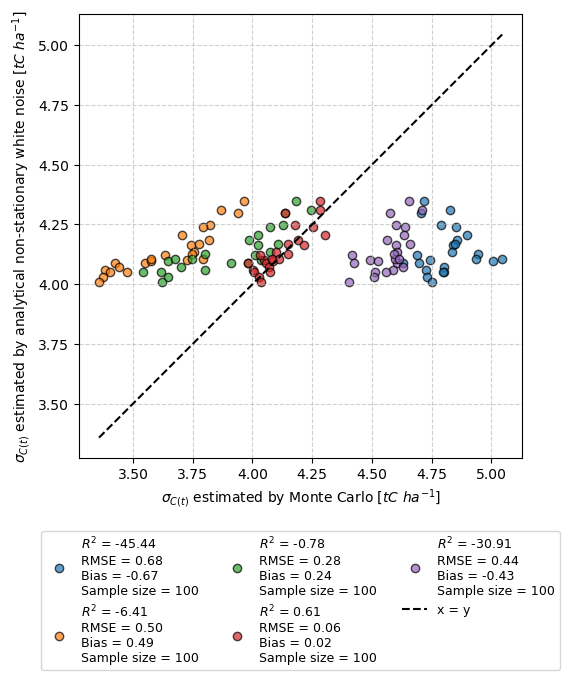

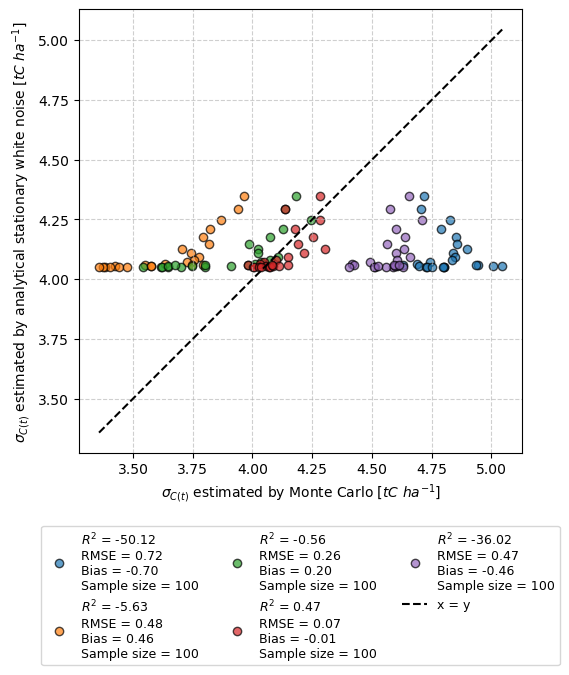

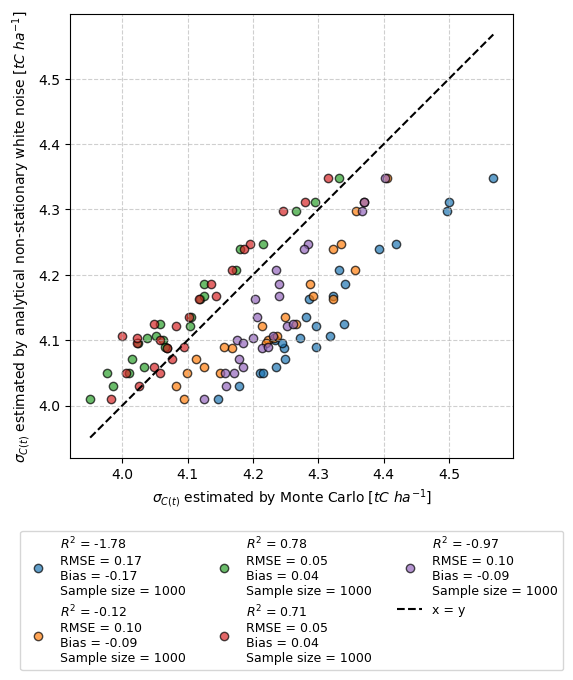

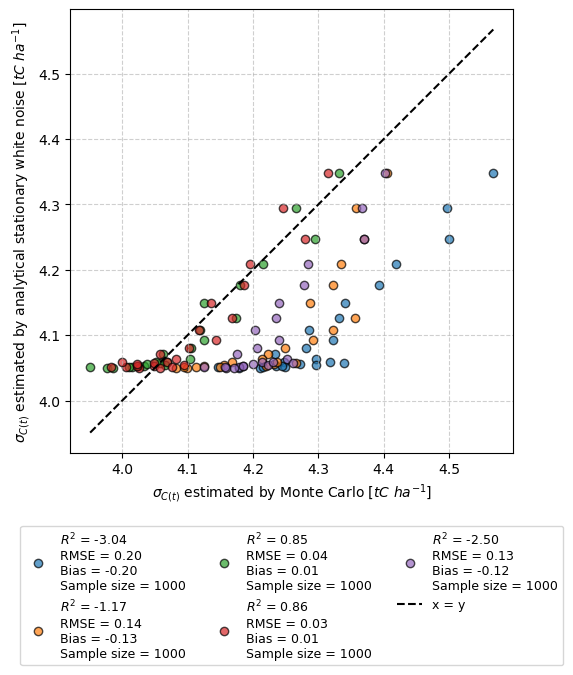

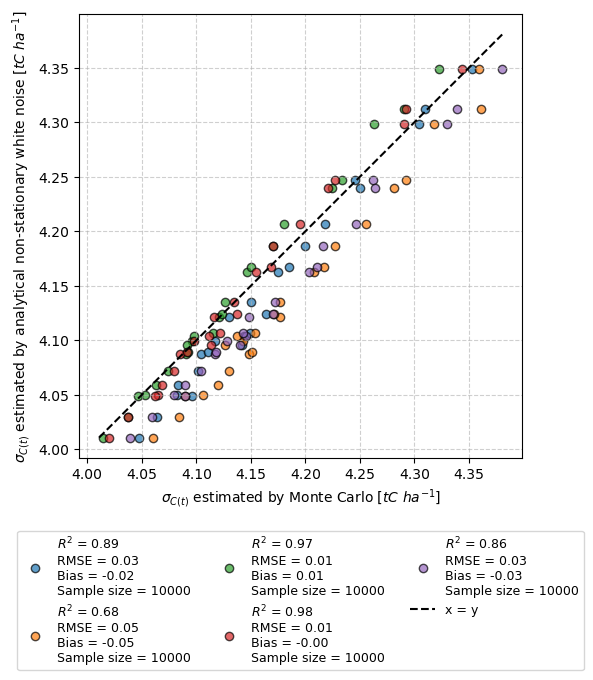

...

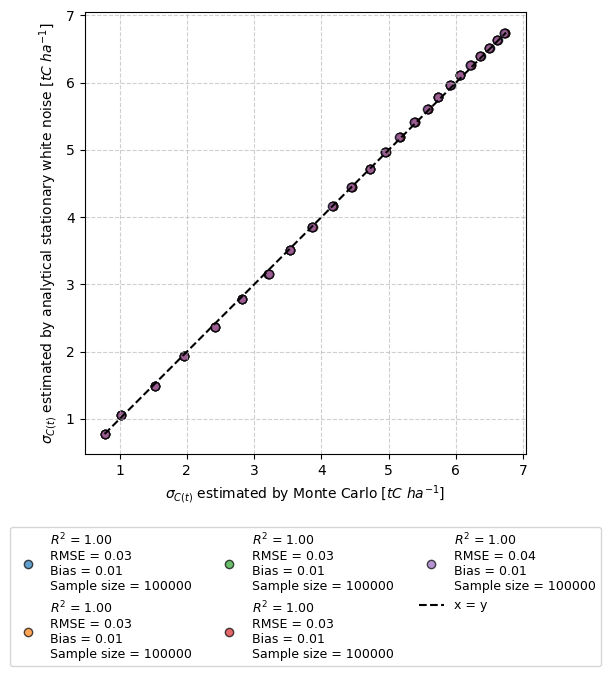

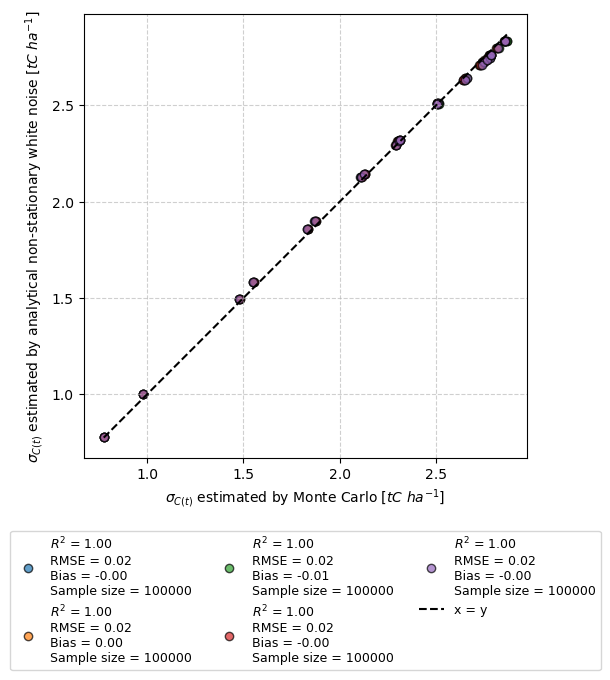

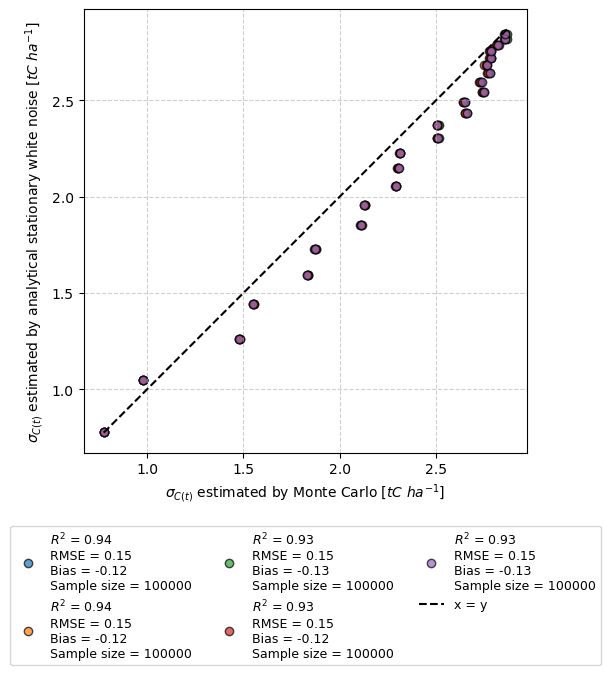

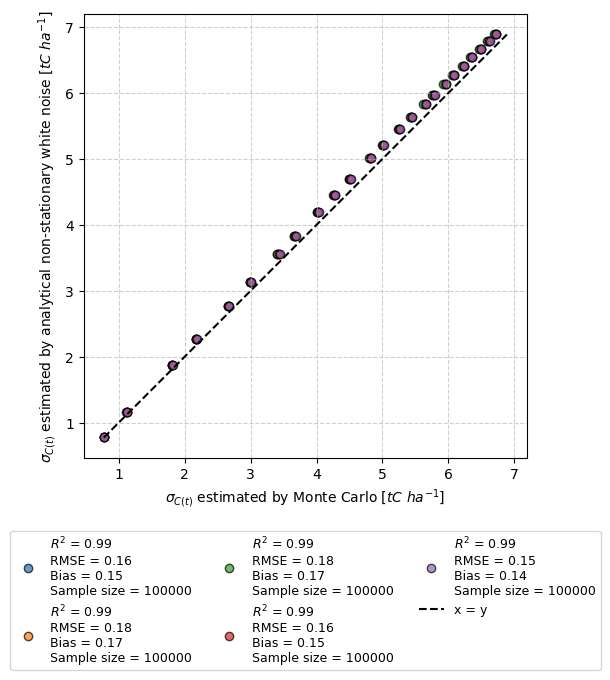

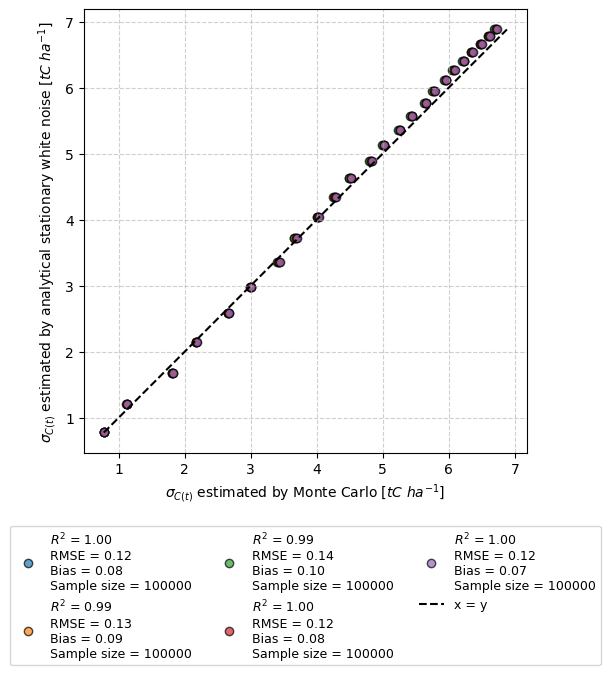

In [18]:
def comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n):
    dir_path_figures = '../figures/MC_size_effect/'
    # Create the repertory if needed
    dir_path_figures = Path(dir_path_figures)
    dir_path_figures.mkdir(parents=True, exist_ok=True)
    
    
    n_to_R2 = {}
    # Metrics
    r2_1 = 1 - np.sum((y - x_1)**2) / np.sum((x_1 - np.mean(x_1))**2)
    rmse_1 = np.sqrt(np.mean((y - x_1)**2))
    bias_1 = np.mean(y - x_1)
    
    r2_2 = 1 - np.sum((y - x_2)**2) / np.sum((x_2 - np.mean(x_2))**2)
    rmse_2 = np.sqrt(np.mean((y - x_2)**2))
    bias_2 = np.mean(y - x_2)
    
    r2_3 = 1 - np.sum((y - x_3)**2) / np.sum((x_3 - np.mean(x_3))**2)
    rmse_3 = np.sqrt(np.mean((y - x_3)**2))
    bias_3 = np.mean(y - x_3)
    
    r2_4 = 1 - np.sum((y - x_4)**2) / np.sum((x_4 - np.mean(x_4))**2)
    rmse_4 = np.sqrt(np.mean((y - x_4)**2))
    bias_4 = np.mean(y - x_4)
    
    r2_5 = 1 - np.sum((y - x_5)**2) / np.sum((x_5 - np.mean(x_5))**2)
    rmse_5 = np.sqrt(np.mean((y - x_5)**2))
    bias_5 = np.mean(y - x_5)
    n_to_R2[n] = [r2_1, r2_2, r2_3, r2_4, r2_5]
    # Plotr2_5
    plt.figure(figsize=(7, 7))
    
    plt.scatter(
        x_1, y,
        alpha=0.7,
        edgecolor='k',
        label=(
            f"$R^2$ = {r2_1:.2f}\n"
            f"RMSE = {rmse_1:.2f}\n"
            f"Bias = {bias_1:.2f}\n"
            f"Sample size = {n}"
         
        )
    )
    
    plt.scatter(
        x_2, y,
        alpha=0.7,
        edgecolor='k',
        label=(
            f"$R^2$ = {r2_2:.2f}\n"
            f"RMSE = {rmse_2:.2f}\n"
            f"Bias = {bias_2:.2f}\n"
            f"Sample size = {n}"
         
        )
    )
    
    plt.scatter(
        x_3, y,
        alpha=0.7,
        edgecolor='k',
        label=(
            f"$R^2$ = {r2_3:.2f}\n"
            f"RMSE = {rmse_3:.2f}\n"
            f"Bias = {bias_3:.2f}\n"
            f"Sample size = {n}"
         
        )
    )
    plt.scatter(
        x_4, y,
        alpha=0.7,
        edgecolor='k',
        label=(
            f"$R^2$ = {r2_4:.2f}\n"
            f"RMSE = {rmse_4:.2f}\n"
            f"Bias = {bias_4:.2f}\n"
            f"Sample size = {n}"
         
        )
    )
    
    plt.scatter(
        x_5, y,
        alpha=0.7,
        edgecolor='k',
        label=(
            f"$R^2$ = {r2_5:.2f}\n"
            f"RMSE = {rmse_5:.2f}\n"
            f"Bias = {bias_5:.2f}\n"
            f"Sample size = {n}"
         
        )
    )
    
    # x = y line over data range
    x_min = min((x_1.min(), x_2.min(), x_3.min(), x_4.min(), x_5.min()))
    x_max = max((x_1.max(), x_2.max(), x_3.max(),x_4.max(), x_5.max()))
    min_val = min(x_min, y.min())
    max_val = max(x_max, y.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', label='x = y')
    
    # Equal scaling (important for comparison plots)
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    # Grid
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # Legend
    plt.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.15),
        ncol=3,
        fontsize=9,
        frameon=True
    )  
    # Title
    #plt.title(title)
    
    plt.tight_layout()
    plt.savefig(dir_path_figures/title)
    plt.show()
    return n_to_R2[n]
    
    


###### LEG ##################
### les sigma 
key = LEG_keys[2]
LEG_n_to_R2 ={}
LEG_n_to_R2_stationary ={}

####n = n_1
n = n_1
# MC vs vari analytical
x_1 = np.std(MC_n_1_LEG['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_1_LEG['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_1_LEG['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_1_LEG['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_1_LEG['s5'][key]['QC'], axis=1)
y = sigma_C_LEG[key]['vari']
xlabel = r'$\sigma_{C(t)}$ estimated by Monte Carlo [$tC~ha^{-1}$]'
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
##title = fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'LEG_MC_non_stationary_{n}_{key}.png'
LEG_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_LEG[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
##title =  fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title = f'LEG_MC_stationary_{n}_{key}.png'
LEG_n_to_R2_stationary[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)


####n = n_2
n = n_2
# MC vs vari analytical
x_1 = np.std(MC_n_2_LEG['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_2_LEG['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_2_LEG['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_2_LEG['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_2_LEG['s5'][key]['QC'], axis=1)
y = sigma_C_LEG[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
##title = fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'LEG_MC_non_stationary_{n}_{key}.png'
LEG_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_LEG[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'LEG_MC_stationary_{n}_{key}.png'
LEG_n_to_R2_stationary[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)


####n = n_3
n = n_3
# MC vs vari analytical
x_1 = np.std(MC_n_3_LEG['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_3_LEG['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_3_LEG['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_3_LEG['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_3_LEG['s5'][key]['QC'], axis=1)
y = sigma_C_LEG[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'LEG_MC_non_stationary_{n}_{key}.png'

LEG_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_LEG[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'LEG_MC_stationary_{n}_{key}.png'

LEG_n_to_R2_stationary[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)

####n = n_4
n = n_4
# MC vs vari analytical
x_1 = np.std(MC_n_4_LEG['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_4_LEG['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_4_LEG['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_4_LEG['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_4_LEG['s5'][key]['QC'], axis=1)
y = sigma_C_LEG[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'LEG_MC_non_stationary_{n}_{key}.png'

LEG_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_LEG[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'LEG_MC_stationary_{n}_{key}.png'

LEG_n_to_R2_stationary[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)

for key in LEG_keys :
    n = n_4
    # MC vs vari analytical
    x_1 = np.std(MC_n_4_LEG['s1'][key]['QC'], axis=1)
    x_2 = np.std(MC_n_4_LEG['s2'][key]['QC'], axis=1)
    x_3 = np.std(MC_n_4_LEG['s3'][key]['QC'], axis=1)
    x_4 = np.std(MC_n_4_LEG['s4'][key]['QC'], axis=1)
    x_5 = np.std(MC_n_4_LEG['s5'][key]['QC'], axis=1)
    y = sigma_C_LEG[key]['vari']
    ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
    #title = fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
    title =  f'LEG_MC_non_stationary_{n}_{key}.png'

    LEG_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
    # MC vs analytical stationnary
    y = sigma_C_LEG[key]['stationary']
    ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
    #title =  fr'LEG - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
    title =  f'LEG_MC_stationary_{n}_{key}.png'

    LEG_n_to_R2_stationary[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)

##### PRO
key = PRO_keys[3]
PRO_n_to_R2 ={}
PRO_n_to_R2_stationary ={}
####n = n_1
n = n_1
# MC vs vari analytical
x_1 = np.std(MC_n_1_PRO['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_1_PRO['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_1_PRO['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_1_PRO['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_1_PRO['s5'][key]['QC'], axis=1)
y = sigma_C_PRO[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'PRO_MC_non_stationary_{n}_{key}.png'

PRO_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_PRO[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'PRO_MC_stationary_{n}_{key}.png'

PRO_n_to_R2_stationary[n]  = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)


####n = n_2
n = n_2
# MC vs vari analytical
x_1 = np.std(MC_n_2_PRO['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_2_PRO['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_2_PRO['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_2_PRO['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_2_PRO['s5'][key]['QC'], axis=1)
y = sigma_C_PRO[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'PRO_MC_non_stationary_{n}_{key}.png'

PRO_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_PRO[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'PRO_MC_stationary_{n}_{key}.png'

PRO_n_to_R2_stationary[n]  = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)


####n = n_3
n = n_3
# MC vs vari analytical
x_1 = np.std(MC_n_3_PRO['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_3_PRO['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_3_PRO['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_3_PRO['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_3_PRO['s5'][key]['QC'], axis=1)
y = sigma_C_PRO[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'PRO_MC_non_stationary_{n}_{key}.png'

PRO_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_PRO[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
#title =  fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'PRO_MC_stationary_{n}_{key}.png'

PRO_n_to_R2_stationary[n]  = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)

####n = n_4
n = n_4
# MC vs vari analytical
x_1 = np.std(MC_n_4_PRO['s1'][key]['QC'], axis=1)
x_2 = np.std(MC_n_4_PRO['s2'][key]['QC'], axis=1)
x_3 = np.std(MC_n_4_PRO['s3'][key]['QC'], axis=1)
x_4 = np.std(MC_n_4_PRO['s4'][key]['QC'], axis=1)
x_5 = np.std(MC_n_4_PRO['s5'][key]['QC'], axis=1)
y = sigma_C_PRO[key]['vari']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
#title = fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
title =  f'PRO_MC_non_stationary_{n}_{key}.png'

PRO_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
# MC vs analytical stationnary
y = sigma_C_PRO[key]['stationary']
ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
##title =  fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
title =  f'PRO_MC_stationary_{n}_{key}.png'

PRO_n_to_R2_stationary[n]  =comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)

for key in PRO_keys:
    n = n_4
    # MC vs vari analytical
    x_1 = np.std(MC_n_4_PRO['s1'][key]['QC'], axis=1)
    x_2 = np.std(MC_n_4_PRO['s2'][key]['QC'], axis=1)
    x_3 = np.std(MC_n_4_PRO['s3'][key]['QC'], axis=1)
    x_4 = np.std(MC_n_4_PRO['s4'][key]['QC'], axis=1)
    x_5 = np.std(MC_n_4_PRO['s5'][key]['QC'], axis=1)
    y = sigma_C_PRO[key]['vari']
    ylabel=r'$\sigma_{C(t)}$ estimated by analytical non-stationary white noise [$tC~ha^{-1}$]'
    #title = fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical varying white noise - {key} '
    title =  f'PRO_MC_non_stationary_{n}_{key}.png'
    
    PRO_n_to_R2[n] = comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
    # MC vs analytical stationnary
    y = sigma_C_PRO[key]['stationary']
    ylabel=r'$\sigma_{C(t)}$ estimated by analytical stationary white noise [$tC~ha^{-1}$]'
    ##title =  fr'PRO - Comparison $\sigma_{{C}}$ MC ({n} samples) vs analytical stationary white noise - {key} '
    title =  f'PRO_MC_stationary_{n}_{key}.png'
    
    PRO_n_to_R2_stationary[n]  =comparison_method(x_1,x_2,x_3,x_4,x_5,y,xlabel,ylabel,title,n)
   

### STABILITY OF MC REGARDING SAMPLE SIZE Fig. 3b


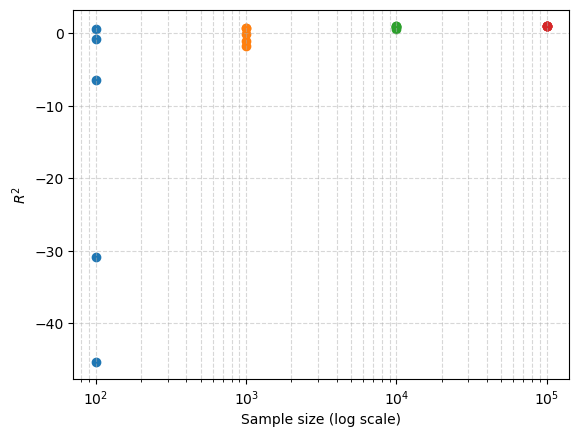

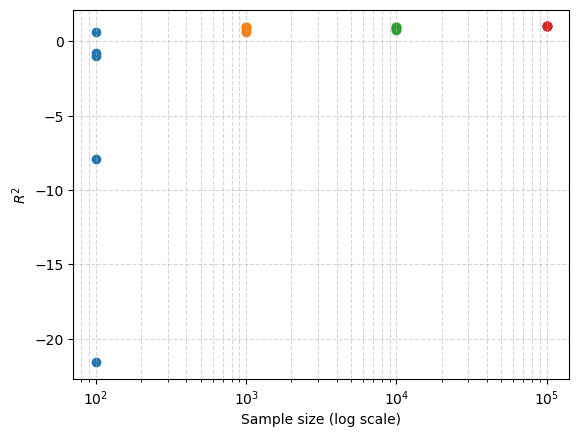

In [19]:
### LEG PLOT
plt.figure()
for n in [n_1, n_2, n_3, n_4]:
    plt.scatter(n * np.ones(len(LEG_n_to_R2[n])), LEG_n_to_R2[n])

plt.xscale('log')
plt.xlabel('Sample size (log scale)')
plt.ylabel('$R^2$ ')
plt.grid(True, which='both', linestyle='--', alpha=0.5)


### PRO PLOT
plt.figure()
for n in [n_1, n_2, n_3, n_4]:
    plt.scatter(n * np.ones(len(PRO_n_to_R2[n])), PRO_n_to_R2[n])

plt.xscale('log')
plt.xlabel('Sample size (log scale)')
plt.ylabel('$R^2$')
plt.grid(True, which='both', linestyle='--', alpha=0.5)

## Results: analytical stationary case vs non-stationary case

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

### function to compute metrics and return a dictionnary containing R2, RMSE and Bias
def compute_metrics(x, y):
    """Compute R², RMSE and bias between x and y."""
    
    residuals = y - x
    
    r2 = 1 - np.sum(residuals**2) / np.sum((x - np.mean(x))**2)
    rmse = np.sqrt(np.mean(residuals**2))
    bias = np.mean(residuals)
    
    return {
        "R²": r2,
        "RMSE": rmse,
        "Bias": bias
    }

### function to plot a scatter plot between the results from the two analytical methods 
def plot_comparison(
    x,
    y,
    metrics,
    xlabel,
    ylabel,
    title,
    save_path=None,
    figsize=(6, 6)
):
    """Plot y versus x with a 1:1 reference line."""
    
    fig, ax = plt.subplots(figsize=figsize)

    ax.scatter(
        x,
        y,
        alpha=0.7,
        edgecolor="k",
        label=(
            rf"$R^2$ = {metrics['R²']:.2f}" "\n"
            rf"RMSE = {metrics['RMSE']:.2f}" "\n"
            rf"Bias = {metrics['Bias']:.2f}"
        )
    )

    # 1:1 line
    min_val = min(np.min(x), np.min(y))
    max_val = max(np.max(x), np.max(y))
    
    ax.plot(
        [min_val, max_val],
        [min_val, max_val],
        "k--",
        label=r"$y=x$"
    )

    ax.set_aspect("equal", adjustable="box")
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    ax.grid(
        True,
        linestyle="--",
        alpha=0.6
    )
    
    ax.legend(
        loc="upper left",
        frameon=True
    )

    fig.tight_layout()

    if save_path is not None:
        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()
    plt.close(fig)
    
    
### Function that call the two previous functions, to compute the stastics metrics and plot the graphic
def comparison_analytical_method(
    x,
    y,
    xlabel,
    ylabel,
    title,
    save_dir="../figures/MC_size_effect/",
    make_plot=True
):
    """Compute comparison metrics and optionally create the plot."""
    
    metrics = compute_metrics(x, y)

    if make_plot:
        save_path = Path(save_dir) / title
        
        plot_comparison(
            x=x,
            y=y,
            metrics=metrics,
            xlabel=xlabel,
            ylabel=ylabel,
            title=title,
            save_path=save_path
        )

    return metrics

xlabel = (
    r'$\sigma_{C(t)}$ estimated by analytical stationary '
    r'white noise [$tC~ha^{-1}$]'
)

ylabel = (
    r'$\sigma_{C(t)}$ estimated by analytical non-stationary '
    r'white noise [$tC~ha^{-1}$]'
)

### Main function that apply previous function that apply the previous functions on all error scenarios
### Plot a graphic per error scenario
### Return a dataframe with all metrics per error scenario
def analyse_analytical_comparison(
    data,
    keys,
    group_name,
    make_plots=True
):
    """Analyze stationary vs non-stationary analytical estimates."""
    
    results = []

    for key in keys:
        
        x = data[key]["stationary"]
        y = data[key]["vari"]

        title = f"{group_name}_stationary_non_stationary_{key}.png"

        metrics = comparison_analytical_method(
            x=x,
            y=y,
            xlabel=xlabel,
            ylabel=ylabel,
            title=title,
            save_dir = '../figures/MC_size_effect/',

            make_plot=make_plots
        )

        results.append({
            "Group": group_name,
            "key": key,
            **metrics
        })

    return pd.DataFrame(results)

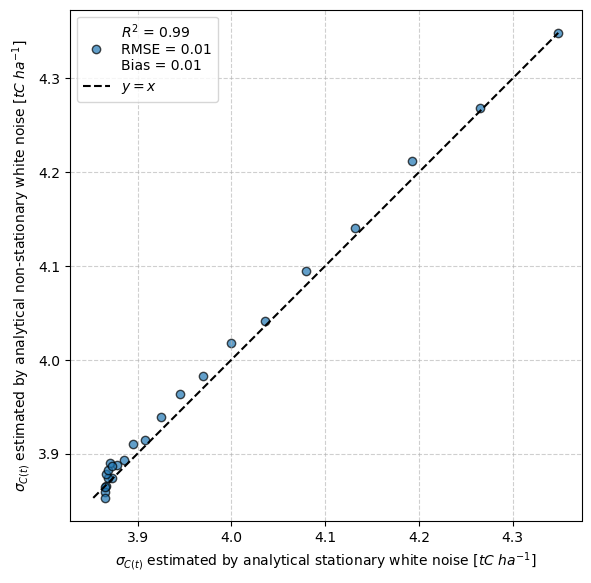

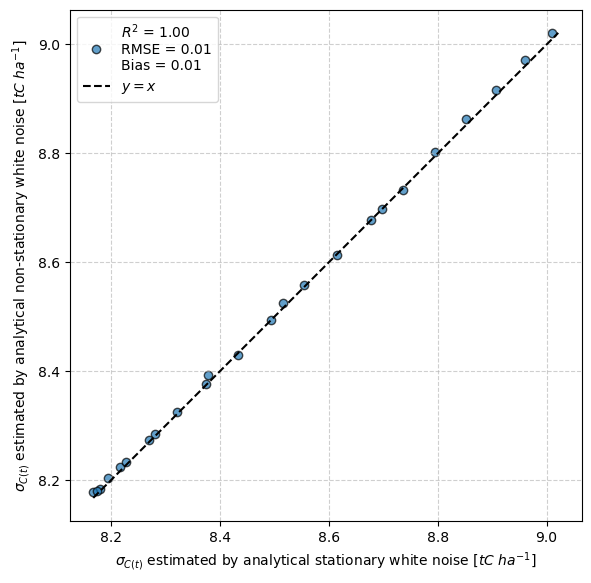

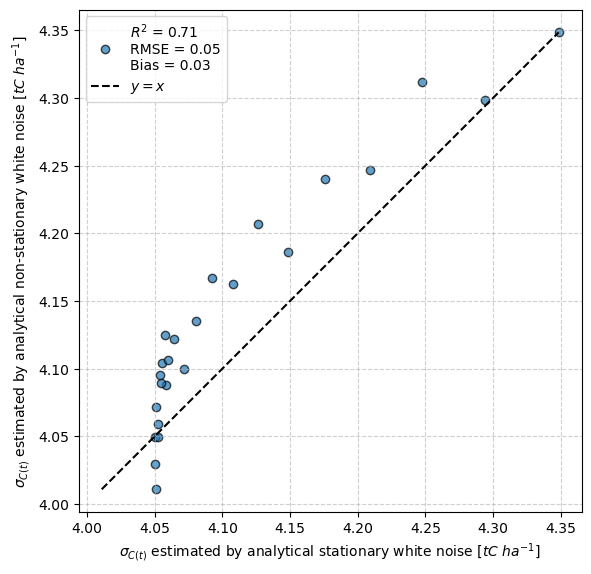

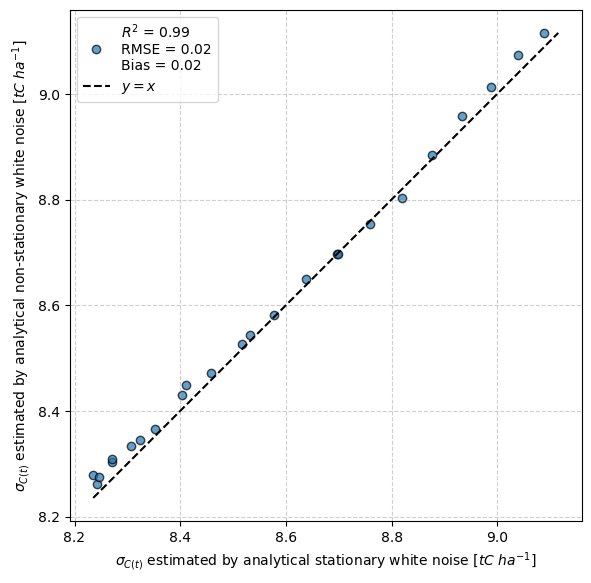

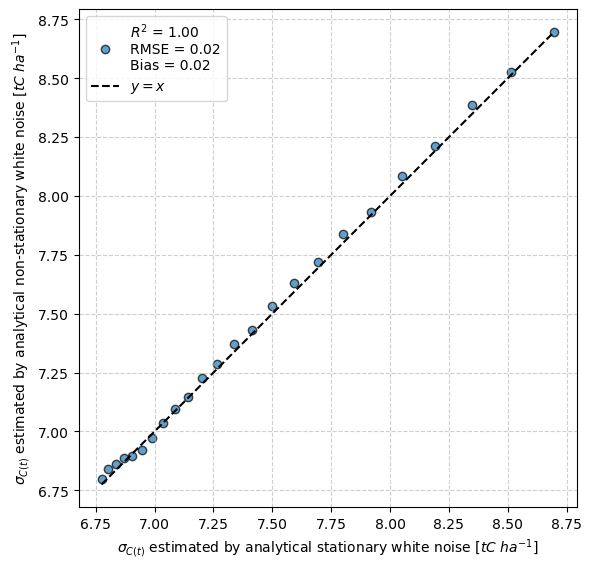

...

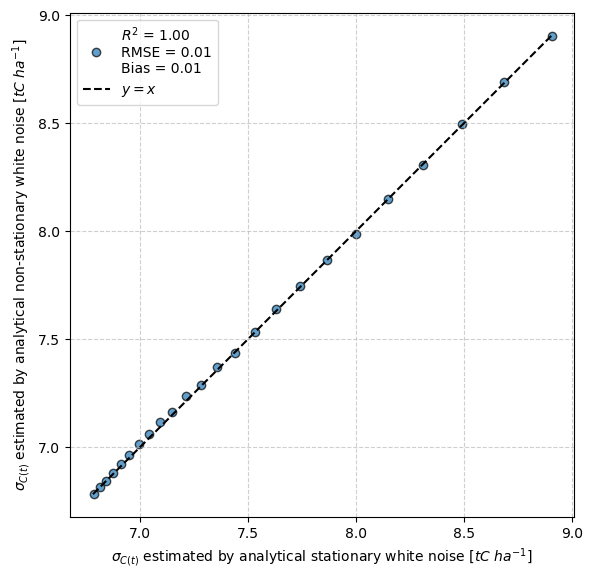

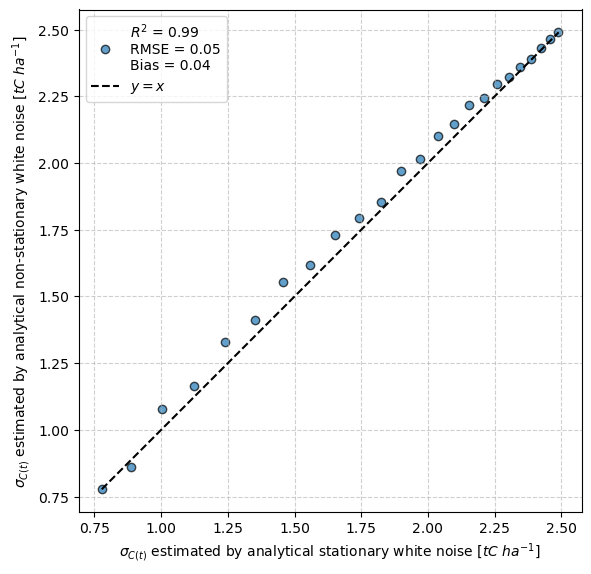

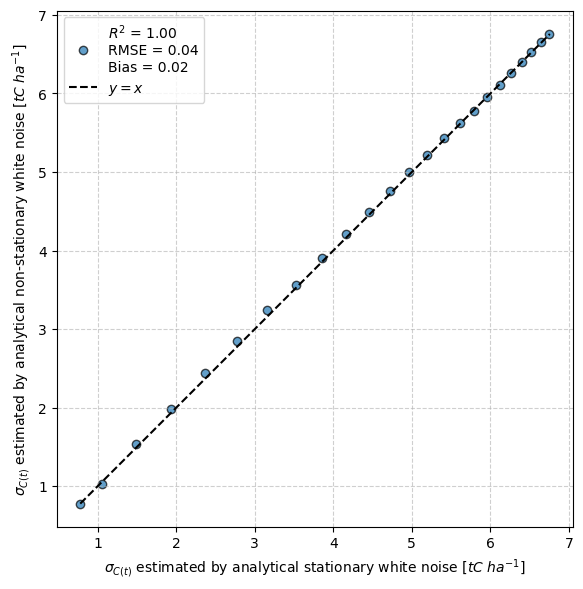

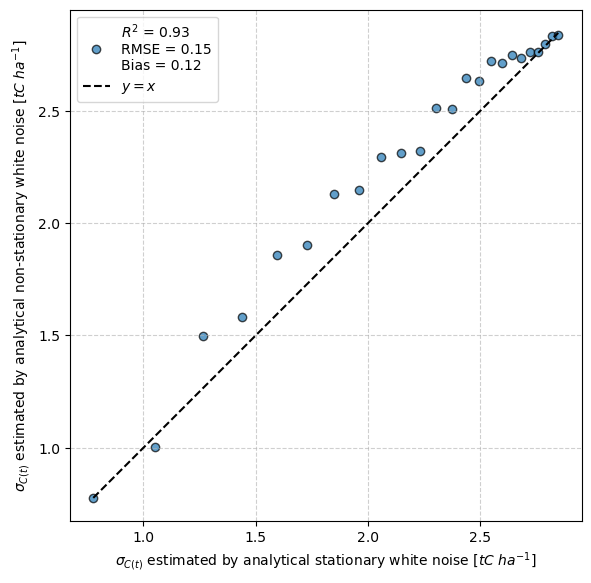

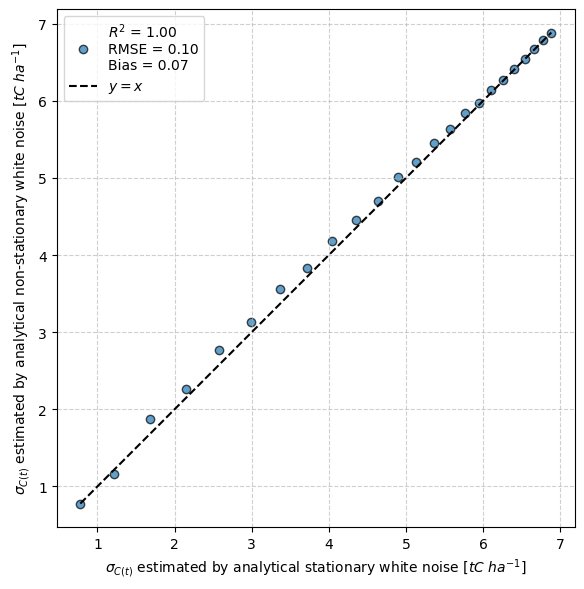

In [24]:
### Application for LEG and PRO treatment
LEG_results = analyse_analytical_comparison(
    sigma_C_LEG,
    LEG_keys,
    "LEG"
)

PRO_results = analyse_analytical_comparison(
    sigma_C_PRO,
    PRO_keys,
    "PRO"
)

In [25]:
# Concatenate the resuls from LEG and PRO treatments
ALL_results = pd.concat(
    [LEG_results, PRO_results],
    ignore_index=True
)

# Compute the statistics over all data
summary = pd.Series({
    "R² median": ALL_results["R²"].median(),
    "R² min": ALL_results["R²"].min(),
    "RMSE median": ALL_results["RMSE"].median(),
    "RMSE max": ALL_results["RMSE"].max(),
    "Bias median": ALL_results["Bias"].median(),
    "Bias min": ALL_results["Bias"].min(),
    "Bias max": ALL_results["Bias"].max(),
})

display(summary.to_frame("LEG + PRO").style.format("{:.4f}"))

,LEG + PRO
R² median,0.9968
R² min,-0.2338
RMSE median,0.0310
RMSE max,0.1536
Bias median,0.0214
Bias min,0.0038
Bias max,0.1219


# Normality assumption 
- We first compute the skewness and the kurtosis of the distributions obtained with Monte Carlo simulations for each time t
- We plot the final distribution at t=24 years

In [26]:
#%% COMPUTE AND SAVE METRICS GAUSSIANITY 
####### PRO ###########
dir_PRO = '../outputs/MC_size_effect/distribution_PRO/'
# Create the repertory if needed
dir_PRO = Path(dir_PRO)
dir_PRO.mkdir(parents=True, exist_ok=True)

metric_gauss_PRO={}
for s in MC_n_3_PRO.keys():
    metric_gauss_PRO[s]={}
    for key in PRO_keys :
        metric_gauss_PRO[s][key]={}
        for t in range(24):
    
            data = MC_n_3_PRO[s][key]['QC'][t]
            
            mu = np.mean(data)
            sigma = np.std(data)
            skewness = skew(data)
            kurt = kurtosis(data, fisher=False)  # par défaut = excess kurtosis
            metric_gauss_PRO[s][key][t] = {'skew' :skewness, 'kurt' :kurt }
np.save(dir_PRO/"metrics_gauss_MC_PRO_n_100000.npy",metric_gauss_PRO)

###### LEG ############

dir_LEG = '../outputs/MC_size_effect/distribution_LEG/'

# Create the repertory if needed
dir_LEG = Path(dir_LEG)
dir_LEG.mkdir(parents=True, exist_ok=True)

metric_gauss_LEG={}
for s in MC_n_3_LEG.keys():
    metric_gauss_LEG[s]={}
    for key in LEG_keys :
        metric_gauss_LEG[s][key]={}
        for t in range(24):
    
            data = MC_n_3_LEG[s][key]['QC'][t]
            
            mu = np.mean(data)
            sigma = np.std(data)
            skewness = skew(data)
            kurt = kurtosis(data, fisher=False)  # par défaut = excess kurtosis
            metric_gauss_LEG[s][key][t] = {'skew' :skewness, 'kurt' :kurt }
np.save(dir_LEG/"metrics_gauss_MC_LEG_n_100000.npy",metric_gauss_LEG)


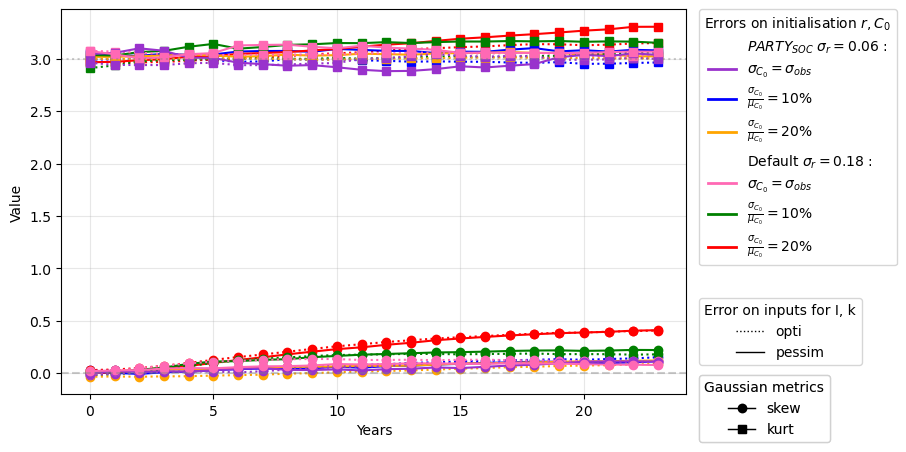

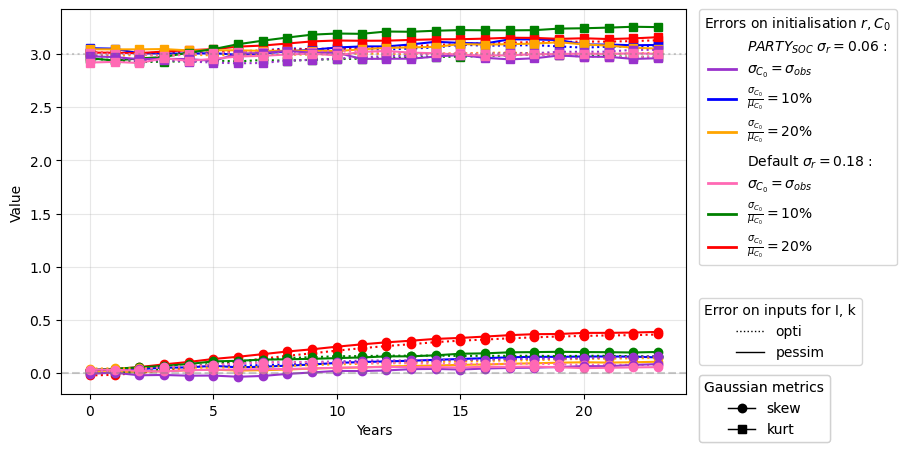

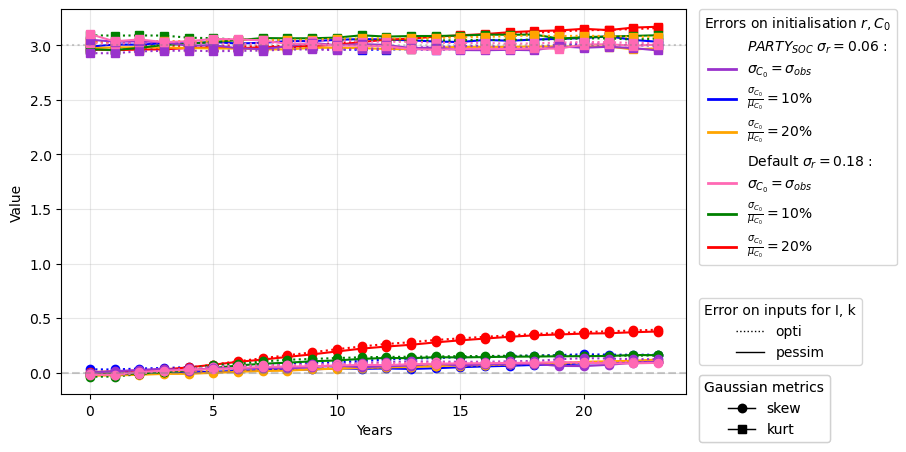

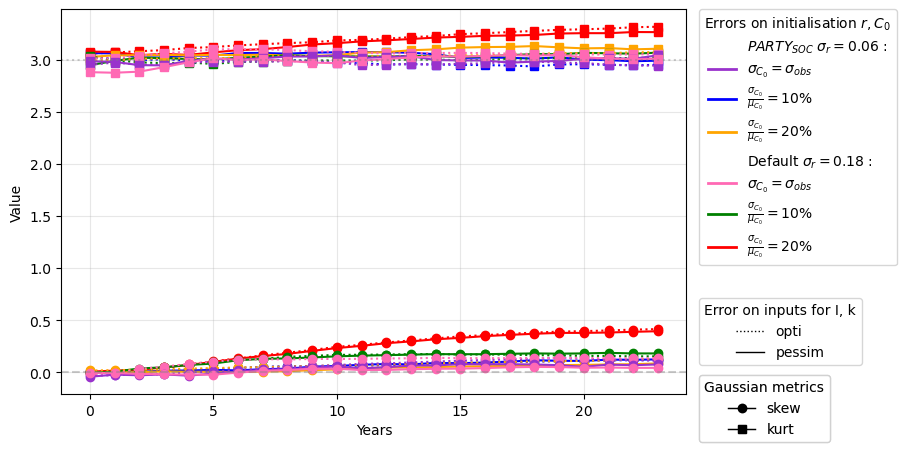

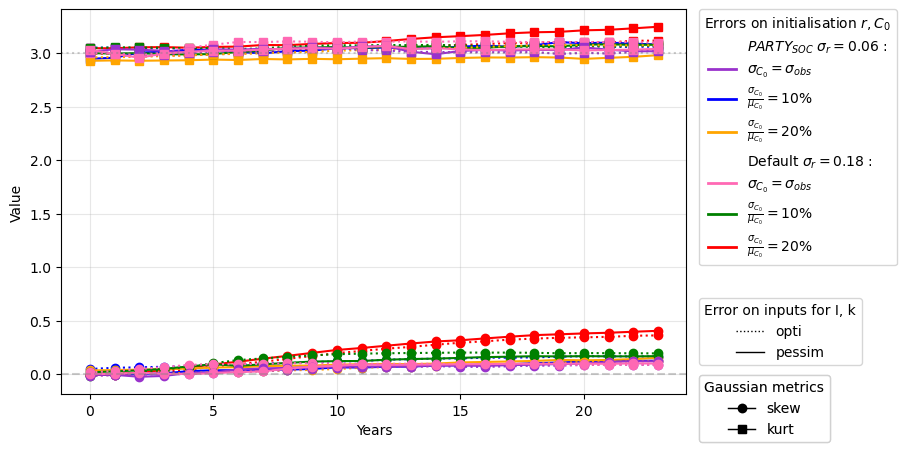

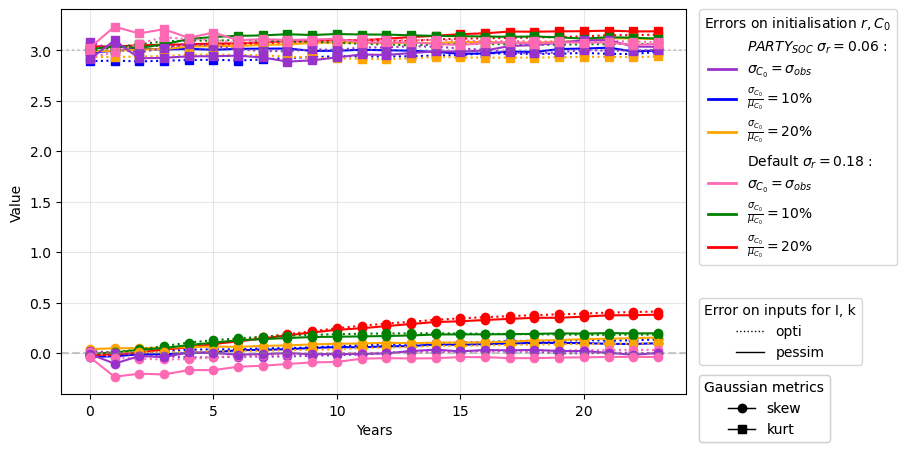

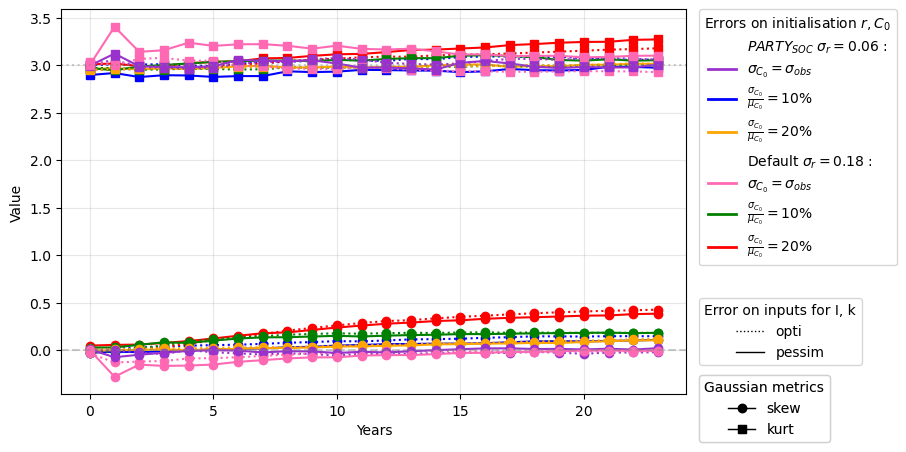

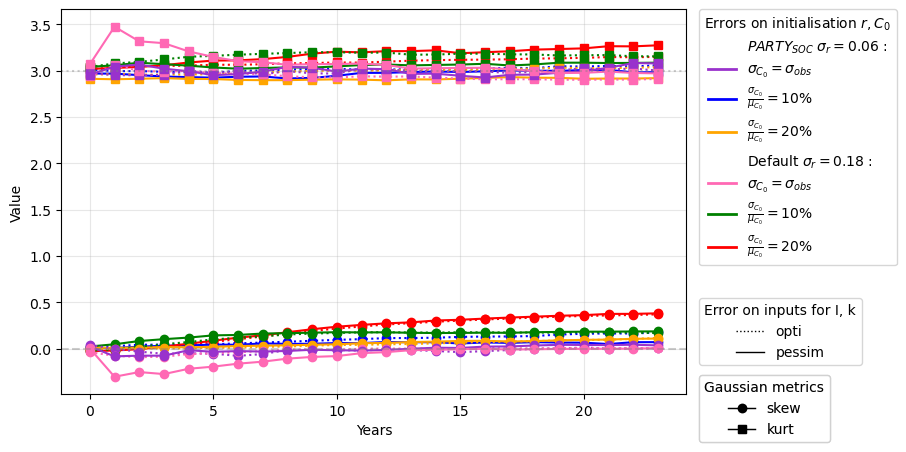

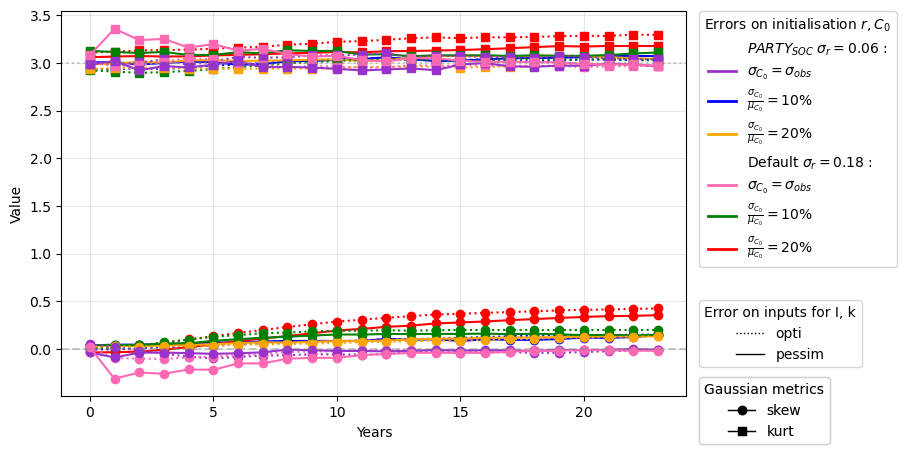

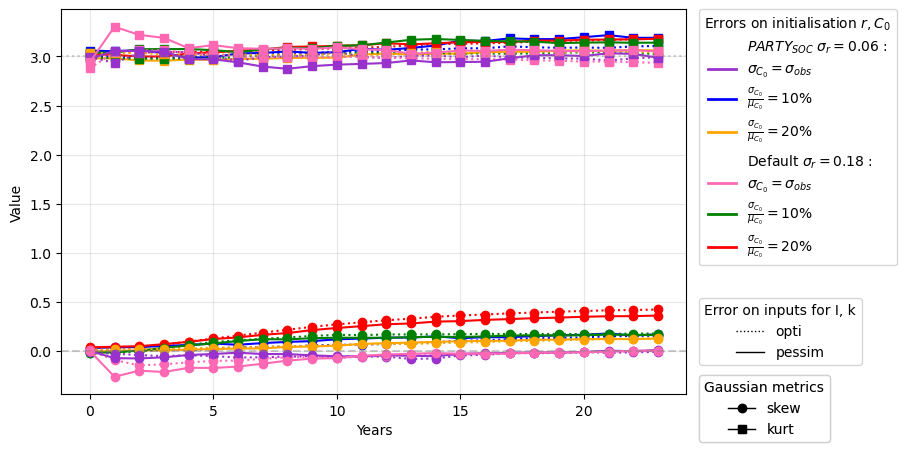

In [27]:
#%% PLOT GAUSSIAN METRIC IN TIME FOR SUPPLEMENTAL MATERIAL (Fig. S7) for each Monte Carlo simulation
## But only for the sample size n = 10⁵
    
label_map = {
    'local':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.06$',
    'large':    r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.18$',
    'localdef': r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=10\%$, $\sigma_r = 0.18$',
    'largeRE':  r'$\frac{\sigma_{C_0}}{\mu_{C_0}}=20\%$, $\sigma_r = 0.06$',
    'mesdef': r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.18$',
    'mesRE':  r'$\sigma_{C_0} =\sigma_{obs}$, $\sigma_r = 0.06$'
}  

color_map_dict = {'local' : 'blue', 'large': 'red', 'largeRE':'orange', 'localdef':'green', 'mesRE':'darkorchid', 'mesdef':'hotpink'}
style_map_dict = {'opti':'dotted', 'pessim':'solid'}

marker_map_dict = {
    'skew': 'o',
    'kurt': 's'
}

dir_path_figures = "../figures/distribution_absolute_SOC_stock/"
# Create the repertory if needed
dir_path_figures = Path(dir_path_figures)
dir_path_figures.mkdir(parents=True, exist_ok=True)

#### LEG

def init_error_order(label):
    if r'\sigma_{C_0} =\sigma_{obs}' in label:
        return 0
    if '10\\%' in label:
        return 1
    if '20\\%' in label:
        return 2
    return 99


for s in metric_gauss_LEG.keys():
    fig, ax = plt.subplots(figsize=(10,5))

    for key in LEG_keys:
        t_vals = sorted(metric_gauss_LEG[s][key].keys())
        metrics = {
            'skew': [metric_gauss_LEG[s][key][t]['skew'] for t in t_vals],
            'kurt': [metric_gauss_LEG[s][key][t]['kurt'] for t in t_vals]
        }

        sigmaQCr = key.split('_')[2]
        sigmakI = key.split('_')[1]

        color = color_map_dict.get(sigmaQCr, 'black')
        linestyle = style_map_dict.get(sigmakI, '-')

        for metric_name, y_vals in metrics.items():
            marker = marker_map_dict.get(metric_name, 'o')
            ax.plot(
                t_vals,
                y_vals,
                color=color,
                linestyle=linestyle,
                marker=marker,
                label=None
            )

    # reference line
    ax.axhline(0, linestyle='--', color='gray', alpha=0.4)
    ax.axhline(3, linestyle=':', color='gray', alpha=0.4)

    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    #ax.set_title(f'LEG - Gaussian metrics evolution (MC sample n°{s})')
    ax.grid(True, alpha=0.3)

    # -------------------
    # Colors of legend ordered as in graphics showing the evolution of uncertainty over time (e.g., Fig. 8 and 10)
    group_006 = []
    group_018 = []

    for k in color_map_dict.keys():
        label = label_map[k]
        entry = (init_error_order(label), k)
        if r'\sigma_r = 0.06' in label:
            group_006.append(entry)
        elif r'\sigma_r = 0.18' in label:
            group_018.append(entry)

    group_006.sort(key=lambda x: x[0])
    group_018.sort(key=lambda x: x[0])

    legend_handles = []
    legend_labels = []

    legend_handles.append(Line2D([], [], linestyle='None'))
    legend_labels.append(r'$PARTY_{SOC}$ $\sigma_r = 0.06$ :')
    for _, k in group_006:
        legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=2))
        legend_labels.append(label_map[k].split(',')[0])

    legend_handles.append(Line2D([], [], linestyle='None'))
    legend_labels.append(r'Default $\sigma_r = 0.18$ :')
    for _, k in group_018:
        legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=2))
        legend_labels.append(label_map[k].split(',')[0])

    color_legend = ax.legend(
        legend_handles,
        legend_labels,
        title='Errors on initialisation $r, C_{0}$',
        loc='upper left',
        bbox_to_anchor=(1.02, 1.0),
        borderaxespad=0,
        handlelength=2
    )
    ax.add_artist(color_legend)

    # -------------------
    # Linestyles legend
    style_proxies = [Line2D([0],[0], color='black', lw=1, linestyle=style_map_dict[k]) for k in style_map_dict.keys()]
    style_labels = list(style_map_dict.keys())

    linestyle_legend = ax.legend(
        style_proxies,
        style_labels,
        title='Error on inputs for I, k',
        loc='upper left',
        bbox_to_anchor=(1.02, 0.25),
        borderaxespad=0
    )
    ax.add_artist(linestyle_legend)

    # -------------------
    # Markers legend
    marker_proxies = [Line2D([0],[0], color='black', lw=1, linestyle='-', marker=marker_map_dict[m]) for m in marker_map_dict.keys()]
    marker_labels = list(marker_map_dict.keys())

    marker_legend = ax.legend(
        marker_proxies,
        marker_labels,
        title='Gaussian metrics',
        loc='upper left',
        bbox_to_anchor=(1.02, 0.05),
        borderaxespad=0
    )
    ax.add_artist(marker_legend)

    fig.subplots_adjust(right=0.75)
    fig.savefig(f'{dir_path_figures}/gaussian_metrics_LEG_{s}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
#%% PRO 
def init_error_order(label):
    if r'\sigma_{C_0} =\sigma_{obs}' in label:
        return 0
    if '10\\%' in label:
        return 1
    if '20\\%' in label:
        return 2
    return 99

for s in metric_gauss_PRO.keys():
    fig, ax = plt.subplots(figsize=(10,5))

    for key in PRO_keys:
        t_vals = sorted(metric_gauss_PRO[s][key].keys())
        metrics = {
            'skew': [metric_gauss_PRO[s][key][t]['skew'] for t in t_vals],
            'kurt': [metric_gauss_PRO[s][key][t]['kurt'] for t in t_vals]
        }

        sigmaQCr = key.split('_')[2]
        sigmakI = key.split('_')[1]

        color = color_map_dict.get(sigmaQCr, 'black')
        linestyle = style_map_dict.get(sigmakI, '-')

        for metric_name, y_vals in metrics.items():
            marker = marker_map_dict.get(metric_name, 'o')
            ax.plot(
                t_vals,
                y_vals,
                color=color,
                linestyle=linestyle,
                marker=marker,
                label=None
            )

    # reference line
    ax.axhline(0, linestyle='--', color='gray', alpha=0.4)
    ax.axhline(3, linestyle=':', color='gray', alpha=0.4)

    ax.set_xlabel('Years')
    ax.set_ylabel('Value')
    #ax.set_title(f'PRO - Gaussian metrics evolution (MC sample n°{s})')
    ax.grid(True, alpha=0.3)

    # -------------------
    # Colors of legend ordered as in graphics showing the evolution of uncertainty over time (e.g., Fig. 8 and 10)
    group_006 = []
    group_018 = []

    for k in color_map_dict.keys():
        label = label_map[k]
        entry = (init_error_order(label), k)
        if r'\sigma_r = 0.06' in label:
            group_006.append(entry)
        elif r'\sigma_r = 0.18' in label:
            group_018.append(entry)

    group_006.sort(key=lambda x: x[0])
    group_018.sort(key=lambda x: x[0])

    legend_handles = []
    legend_labels = []

    legend_handles.append(Line2D([], [], linestyle='None'))
    legend_labels.append(r'$PARTY_{SOC}$ $\sigma_r = 0.06$ :')
    for _, k in group_006:
        legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=2))
        legend_labels.append(label_map[k].split(',')[0])

    legend_handles.append(Line2D([], [], linestyle='None'))
    legend_labels.append(r'Default $\sigma_r = 0.18$ :')
    for _, k in group_018:
        legend_handles.append(Line2D([0], [0], color=color_map_dict[k], lw=2))
        legend_labels.append(label_map[k].split(',')[0])

    color_legend = ax.legend(
        legend_handles,
        legend_labels,
        title='Errors on initialisation $r, C_{0}$',
        loc='upper left',
        bbox_to_anchor=(1.02, 1.0),
        borderaxespad=0,
        handlelength=2
    )
    ax.add_artist(color_legend)

    # -------------------
    # Linestyles legends
    style_proxies = [Line2D([0],[0], color='black', lw=1, linestyle=style_map_dict[k]) for k in style_map_dict.keys()]
    style_labels = list(style_map_dict.keys())

    linestyle_legend = ax.legend(
        style_proxies,
        style_labels,
        title='Error on inputs for I, k',
        loc='upper left',
        bbox_to_anchor=(1.02, 0.25),
        borderaxespad=0
    )
    ax.add_artist(linestyle_legend)

    # -------------------
    # Markers legends
    marker_proxies = [Line2D([0],[0], color='black', lw=1, linestyle='-', marker=marker_map_dict[m]) for m in marker_map_dict.keys()]
    marker_labels = list(marker_map_dict.keys())

    marker_legend = ax.legend(
        marker_proxies,
        marker_labels,
        title='Gaussian metrics',
        loc='upper left',
        bbox_to_anchor=(1.02, 0.05),
        borderaxespad=0
    )
    ax.add_artist(marker_legend)

    fig.subplots_adjust(right=0.75)
    fig.savefig(f'{dir_path_figures}/gaussian_metrics_PRO_{s}.png', dpi=300, bbox_inches='tight')
    plt.show()



### PLOT FINAL DISTRIBUTION TO SEE IF STILL GAUSSIAN Fig.2 AND Fig. S5 and S6.

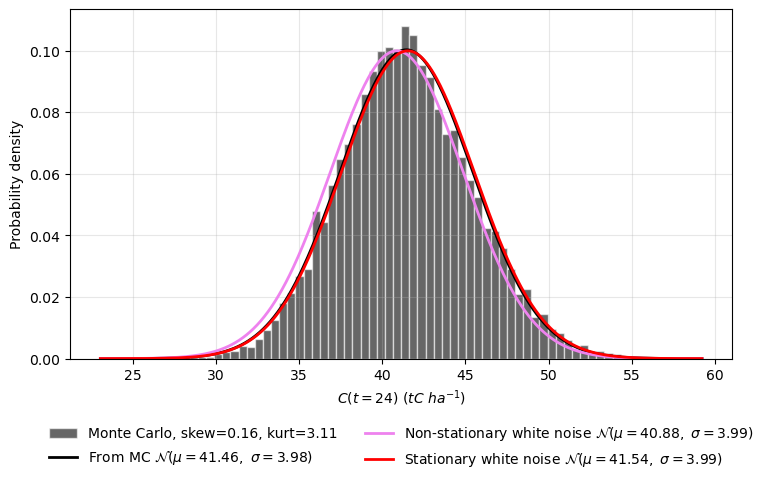

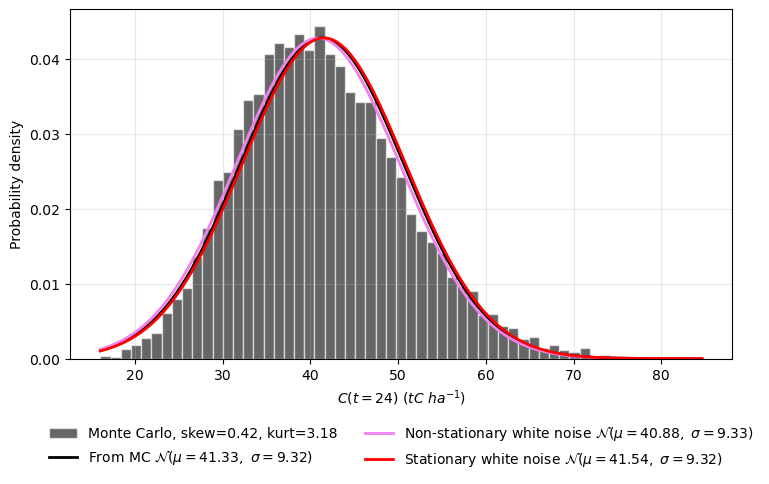

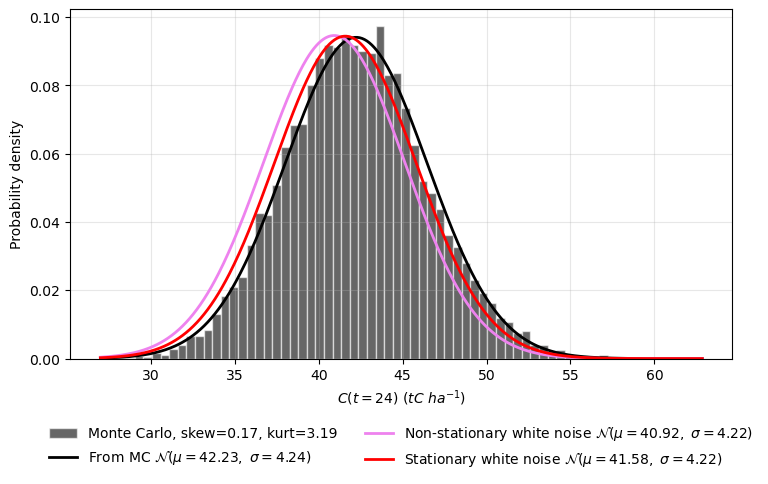

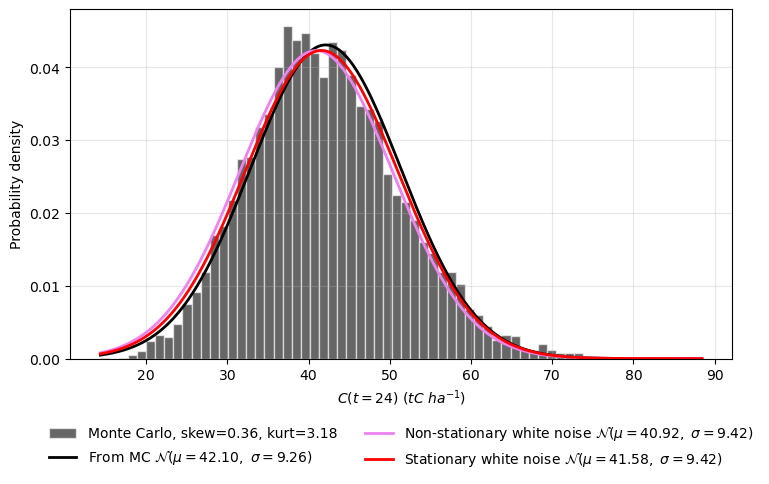

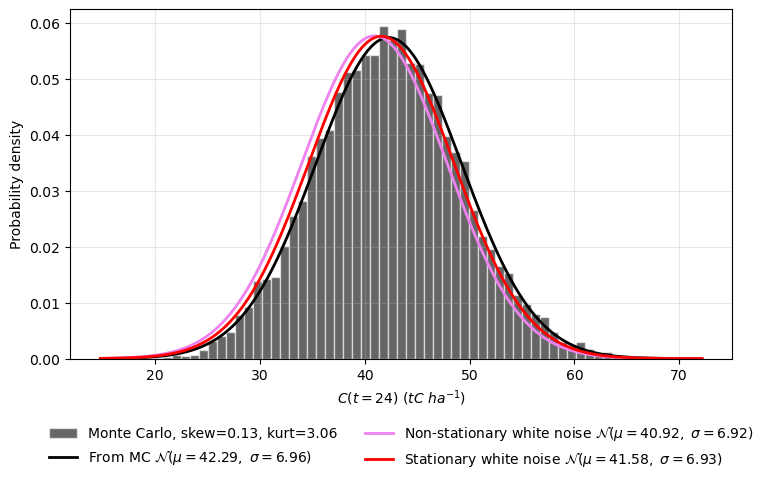

...

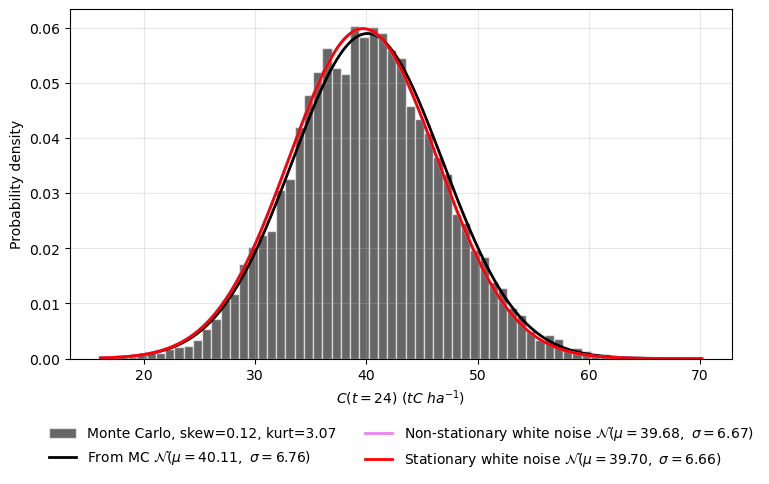

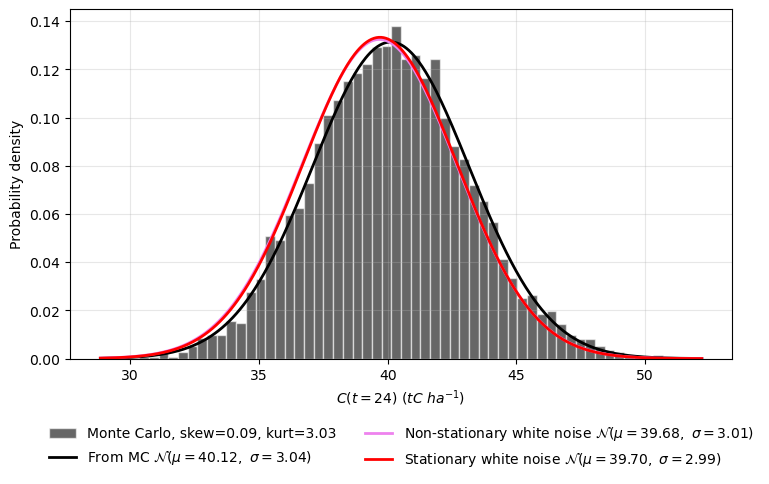

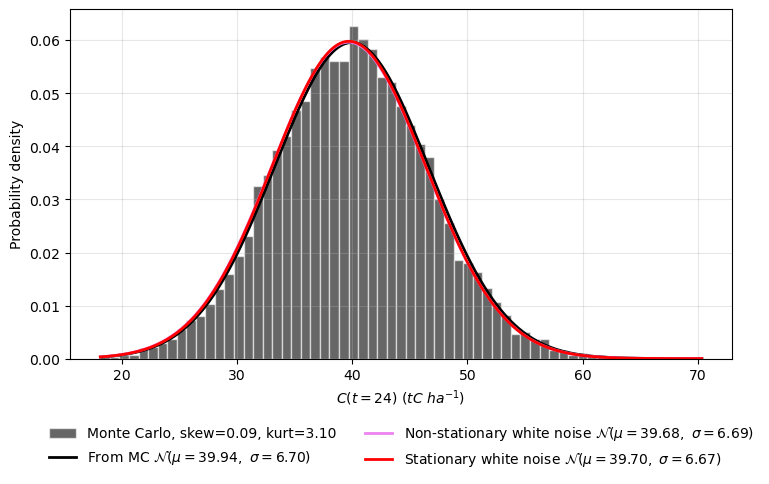

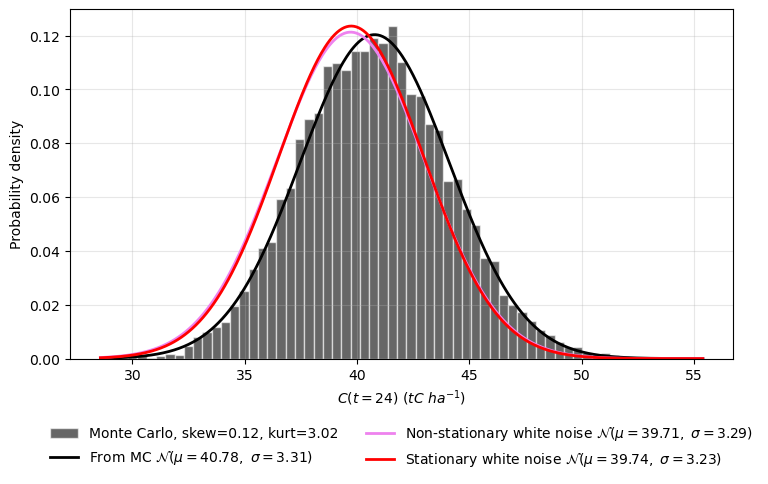

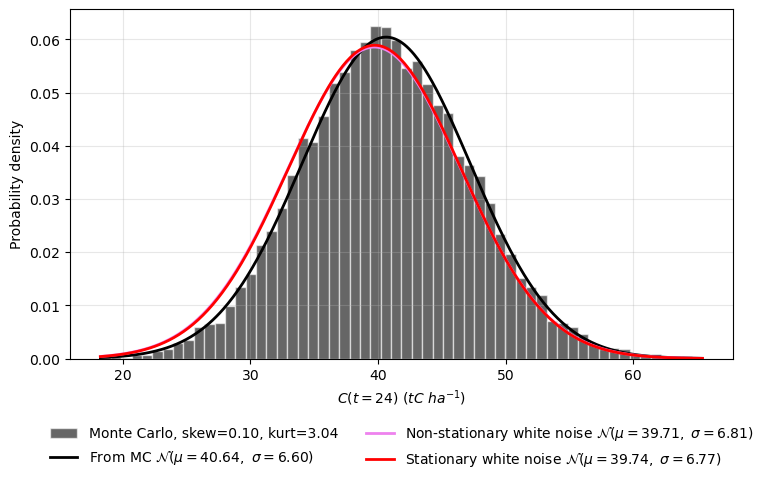

In [28]:

############# PRO #######################
for key in PRO_keys :

    data = MC_n_3_PRO['s5'][key]['QC'][-1]
    
    mu = np.mean(data)
    sigma = np.std(data)
    skewness = skew(data)
    kurt = kurtosis(data, fisher=False)  #  by default = excess kurtosis
            
            
    plt.figure(figsize=(8, 5))
    
    # Distribution of Monte Carlo simulations
    plt.hist(
        data,
        bins='fd',
        density=True,
        alpha=0.6,
        color='black',
        edgecolor='white',
        label=fr'Monte Carlo, skew={skewness:.2f}, kurt={kurt:.2f}'
    )
    
    # Analytical gaussian
    x = np.linspace(data.min(), data.max(), 500)
    y = norm.pdf(x, mu, sigma)
    y_WN = norm.pdf(x, mu_C_PRO[key]['vari'][-1], sigma_C_PRO[key]['vari'][-1])
    y_WN_stationary = norm.pdf(x, mu_C_PRO[key]['stationary'][-1], sigma_C_PRO[key]['stationary'][-1])
    
    plt.plot(
        x, y,
        linewidth=2,
        label=(
        fr'From MC '
        fr'$\mathcal{{N}}(\mu={mu:.2f},\ \sigma={sigma:.2f})$'
        
    ),
        color='black'
    
    )
    
    
    plt.plot(
        x, y_WN,
        linewidth=2,
        label=fr'Non-stationary white noise $\mathcal{{N}}(\mu={mu_C_PRO[key]["vari"][-1]:.2f},\ \sigma={sigma_C_PRO[key]["vari"][-1]:.2f})$',
        color='violet'
    
    )
    
    plt.plot(
        x, y_WN_stationary,
        linewidth=2,
        label=fr'Stationary white noise $\mathcal{{N}}(\mu={mu_C_PRO[key]["stationary"][-1]:.2f},\ \sigma={sigma_C_PRO[key]["stationary"][-1]:.2f})$',
        color='red'
    
    )
    
    #plt.title(f'Distribution of Monte Carlo for PRO -{key}- at t = 24 years')
    plt.xlabel(r"$C(t=24)~(tC~ha^{-1})$")
    plt.ylabel('Probability density')
    plt.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.15),
        ncol=2,   # or 3
        frameon=False
    )
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f"{dir_path_figures}/{key}_hist_final_t24.png", bbox_inches='tight')


    plt.show()


############ LEG ######################

metric_gauss_LEG = {} 
for key in LEG_keys:
    data = MC_n_3_LEG['s5'][key]['QC'][-1]
    
    mu = np.mean(data)
    sigma = np.std(data)
    
    skewness = skew(data)
    kurt = kurtosis(data, fisher=False)  #  by default = excess kurtosis
    
    metric_gauss_LEG[key] = {'skew' :skewness, 'kurt' :kurt }
    ## white noise varying
    
    plt.figure(figsize=(8, 5))
    
    # Distribution of Monte Carlo simulations
    plt.hist(
        data,
        bins='fd',
        density=True,
        alpha=0.6,
        color='black',
        edgecolor='white',
        label=fr'Monte Carlo, skew={skewness:.2f}, kurt={kurt:.2f}'
    )
    
    # Analytical gaussian
    x = np.linspace(data.min(), data.max(), 500)
    y = norm.pdf(x, mu, sigma)
    y_WN = norm.pdf(x, mu_C_LEG[key]['vari'][-1], sigma_C_LEG[key]['vari'][-1])
    y_WN_stationary = norm.pdf(x, mu_C_LEG[key]['stationary'][-1], sigma_C_LEG[key]['stationary'][-1])
    
    plt.plot(
        x, y,
        linewidth=2,
        label=(
        fr'From MC '
        fr'$\mathcal{{N}}(\mu={mu:.2f},\ \sigma={sigma:.2f})$'
        
    ),
        color='black'
    
    )
    
    plt.plot(
        x, y_WN,
        linewidth=2,
        label=fr'Non-stationary white noise $\mathcal{{N}}(\mu={mu_C_LEG[key]["vari"][-1]:.2f},\ \sigma={sigma_C_LEG[key]["vari"][-1]:.2f})$',
        color='violet'
    
    )
    
    
    plt.plot(
        x, y_WN_stationary,
        linewidth=2,
        label=fr'Stationary white noise $\mathcal{{N}}(\mu={mu_C_LEG[key]["stationary"][-1]:.2f},\ \sigma={sigma_C_LEG[key]["stationary"][-1]:.2f})$',
        color='red'
    
    )
    
    #plt.title(f'Distribution of Monte Carlo for LEG -{key}- at t = 24 years')
    plt.xlabel(r"$C(t=24)~(tC~ha^{-1})$")
    plt.ylabel('Probability density')
    plt.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.15),
        ncol=2,   # or 3
        frameon=False
    )
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f"{dir_path_figures}/{key}_hist_final_t24.png", bbox_inches='tight')

    plt.show()